# Approximating Governing Equations Using One-Step Residual Neural Networks

####  Cameron Laedtke,  PHYS/AST 4041

This notebook demonstrates the use of a one-step residual neural network for data-driven equation approximation. The method aims to be useful for recovering unknown governing equations based only on coarsely distributed observational data of trajectories. For testing, we use the dynamical system of a damped pendulum with a dataset of trajectories generated by an accurate ODE solver. Two different implimentations of the neural network are shown in this notebook - one using plain NumPy, and another using TensorFlow's Keras API. Results from both implimentations will be presented and compared with the paper by. T. Qin et al [1] which this project was based on. 


### Damped Pendulum


The damped pendulum is a nonliner differential equation which takes the form,

$$ \left\{ \begin{array}{l}\dot{x}_{1}=x_{2} \\ \dot{x}_{2}=-\alpha x_{2}-\beta \sin x_{1}\end{array} \right. $$

We use the same values of $\alpha=0.2$ and $\beta=8.91$ as in the paper. The plots below [1] show time-evolution of the damped pendulum with these values of  $\alpha$ and $\beta$ for a specific set of initial conditions  $[x_{0}, \dot{x}_{0}] = [-1.193, -3.876]$. It also shows the one-step residual neural network approximations that we aim to replicate. 



### Important Comments


- *As a challenge, I decided to impliment the neural network using plain NumPy, but included the Keras implimentation since there are some interesting differences between the two implimentations.*
- *Additionally, I tried experimenting with a JIT compiler to accelerate the training. I included it in a seperate notebook but didn't include it in my analysis since there isn't much to add.*
- *Unfortunately this notebook will take around an hour to run (tested on 2019 MacBook Pro).There are no benefits to using a GPU here since we're working with very small batch sizes. It is very "loopy" and single-threaded code, which is why using a JIT compiler has such a big impact on training time (about 20X faster per epoch).*. 
- *I didn't provide much of a detailed explanation of the forward and backward propagation algorithms, since those are explained in detail in my mid-term paper.* 

In [1]:
import time
import numpy as np
from typing import List, Tuple
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.integrate import odeint
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from IPython import display
from IPython.display import clear_output, Image

from utils import (generate_batches, plot_history, plot_keras_history, plot_trajectory,
                   plot_multiple_trajectories, predict_solution, predict_keras_solution, 
                   predict_multiple_solutions, predict_multiple_solutions_keras, 
                   get_true_vector_field, get_predicted_vector_field, 
                   get_normalized_vector_coords, get_error, get_errors)


%config InlineBackend.figure_format = 'retina'
plt.rc('font', family='serif')
plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)
plt.style.use('seaborn-whitegrid')
nb_start = time.time()

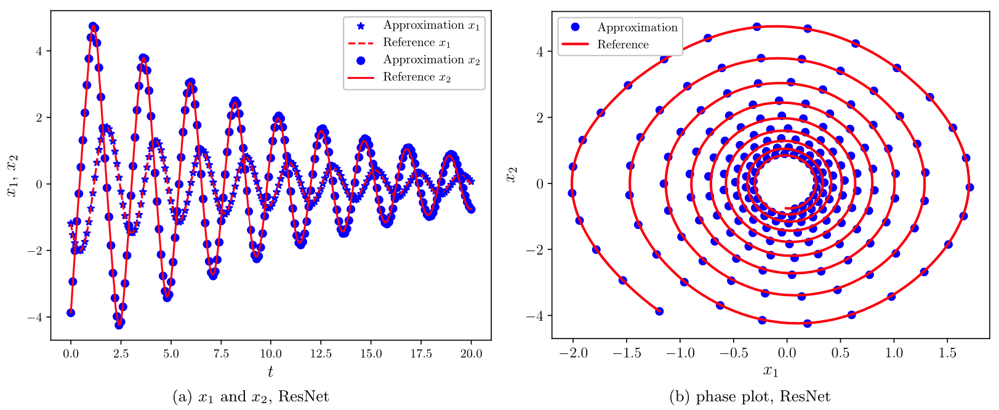

In [2]:
Image(filename='resnet_paper_plots.png') 

# Data Generation


The dataset is generated from a large number of short bursts of trajectories, where each trajectory is generated using a different set of initial conditions. Specifically, each datapoint in the dataset is a pair of solution states $\left( \mathbf{z_{j}^{(1)}}, \mathbf{z_{j}^{(2)}} \right)$ along one trajectory at two different time instances, separated by a time lag $\Delta $. 


Each pair of solution states is generated by the following process
- A set of initial conditions $[x_{0}, \dot{x}_{0}]$ is randomly chosen, where $x_{0}$ and $\dot{x}_{0}$ are sampled from the domains $[-\pi, \pi]$ and $[-2\pi, 2\pi]$ respectively. 
- A highly accurate ODE solver is marched forward from $t=0$ to $t=\Delta$
- The solution states at $t=0$ and $t=\Delta$ are recorded as

$$\mathbf{z_{j}^{(1)}} = \left[ x(0), \ \dot{x}(0) \right] + \epsilon_{j}^{(1)}$$ 

$$\mathbf{z_{j}^{(2)}} = \left[ x(\Delta), \ \dot{x}(\Delta) \right] + \epsilon_{j}^{(2)}$$

where $\epsilon_{j}^{(1)}$ and $\epsilon_{j}^{(2)}$ are small amounts of random noise added to represent potential error in the data. The models will be trained and evaluated on a dataset with no noise ($\epsilon = 0$) and with a small amount of noise ($\epsilon = 0.05$).

In [3]:
def damped_pendulum(y, t, α, β):
        θ, dθdt = y     
        return dθdt, -α*dθdt - β*np.sin(θ)


def generate_damped_pendulum_solution(N_SAMPLES=25000, α=0.2, β=8.91, Δ=0.1, 
    x0=[-1.193, -3.876], dataset=False, t_end=25, noise=0.0):
    """
        :param N_SAMPLES - size of dataset if dataset=True
        :param α - parameter governing differential equation
        :param β - parameter governing differential equation
        :param Δ - time lag between solution state pairs
        :param x0 - initial conditions of differential equation, used if dataset=False
        :param dataset 
            True -  generate dataset of solution states pairs,  
            False - generate a single solution for a specified set of initial 
                    conditions x0.
        :param t_end: value of last timestep of ode solver, used if dataset=False
        :param noise - amount of random noise to add to solution states, 
                       used if dataset=True
    """
    if not dataset:
        t = np.linspace(0, t_end, 100000)
        sol = odeint(damped_pendulum, x0, t, args=(α, β))
        x = sol[:,0]
        dxdt = sol[:,1]
        return t, x, dxdt
    else:
        # Define time array for ODE solver to integrate over. 
        t = np.linspace(0, Δ, 10000)
        
        # Arrays that will store Z(1) and Z(2)
        X = np.zeros((N_SAMPLES, 2))
        Y = np.zeros((N_SAMPLES, 2))

        for i in range(0,N_SAMPLES):
            if i%100==0:
                print("\r generating {} / {}".format(i+100, N_SAMPLES), end='')
            # Generate random initial conditions
            θ_0 = np.random.uniform(-np.pi, np.pi)
            dθdt_0 = np.random.uniform(-2*np.pi, 2*np.pi)
            x0 = [θ_0, dθdt_0]
            # Generate solution from t=0 to t=Δ
            sol = odeint(damped_pendulum, x0, t, args=(α, β))
            # Generate noise terms (no noise if `noise=0`)
            ε_1 = np.random.uniform(-noise, noise)
            ε_2 = np.random.uniform(-noise, noise)
            # Extract solution state at t=Δ
            θ_Δ = sol[-1,0]
            dθdt_Δ = sol[-1,1]

            X[i,0] = θ_0 + ε_1
            X[i,1] = dθdt_0 + ε_1

            Y[i,0] = θ_Δ + ε_2
            Y[i,1] = dθdt_Δ + ε_2

        return X, Y

In [4]:
t, x, dxdt = generate_damped_pendulum_solution(
    dataset=False, α=0.2, β=8.91, t_end=20, noise=0.0)

Below is a plot of the time-evolution of the ODE solver's solution for $\alpha=0.2, \beta=8.91$ with initial conditions $[x_{0}, \dot{x}_{0}] = [-1.193, -3.876]$.

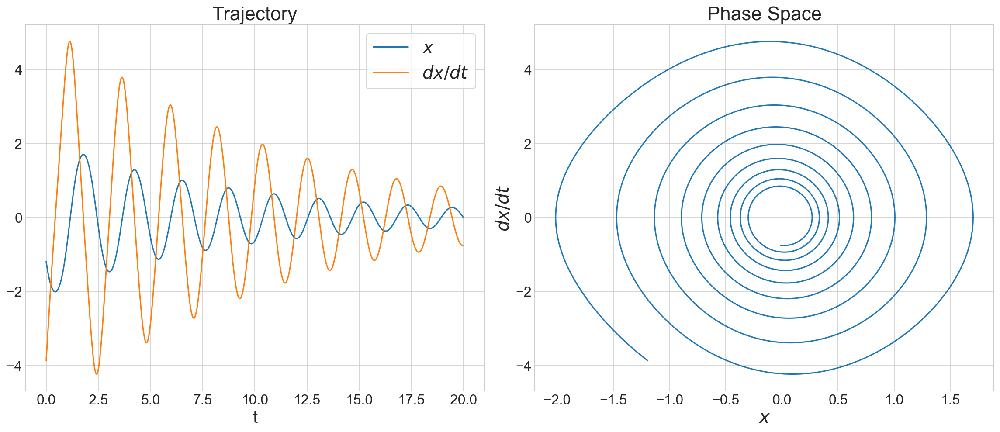

In [5]:
plt.figure(figsize=(16,7))

plt.subplot(1,2,1)
plt.title("Trajectory", fontsize=22)
plt.plot(t, x, "-", label=r"$x$")
plt.plot(t, dxdt, "-", label=r"$dx/dt$")
plt.xlabel("t", fontsize=20)
plt.legend(prop={"size":20}, frameon=True, markerscale=2)

plt.subplot(1,2,2)
plt.title("Phase Space", fontsize=22)
plt.plot(x, dxdt, "-")
plt.xlabel(r"$x$", fontsize=20)
plt.ylabel(r"$dx/dt$", fontsize=20)
plt.tight_layout()
plt.show()

In [6]:
X_sample, Y_sample = generate_damped_pendulum_solution(
    N_SAMPLES=100, α=0.2, β=8.91, Δ=0.1, dataset=True, noise=0.0)

 generating 100 / 100

The plot below shows a sample of solution state pairs that are used to train the model

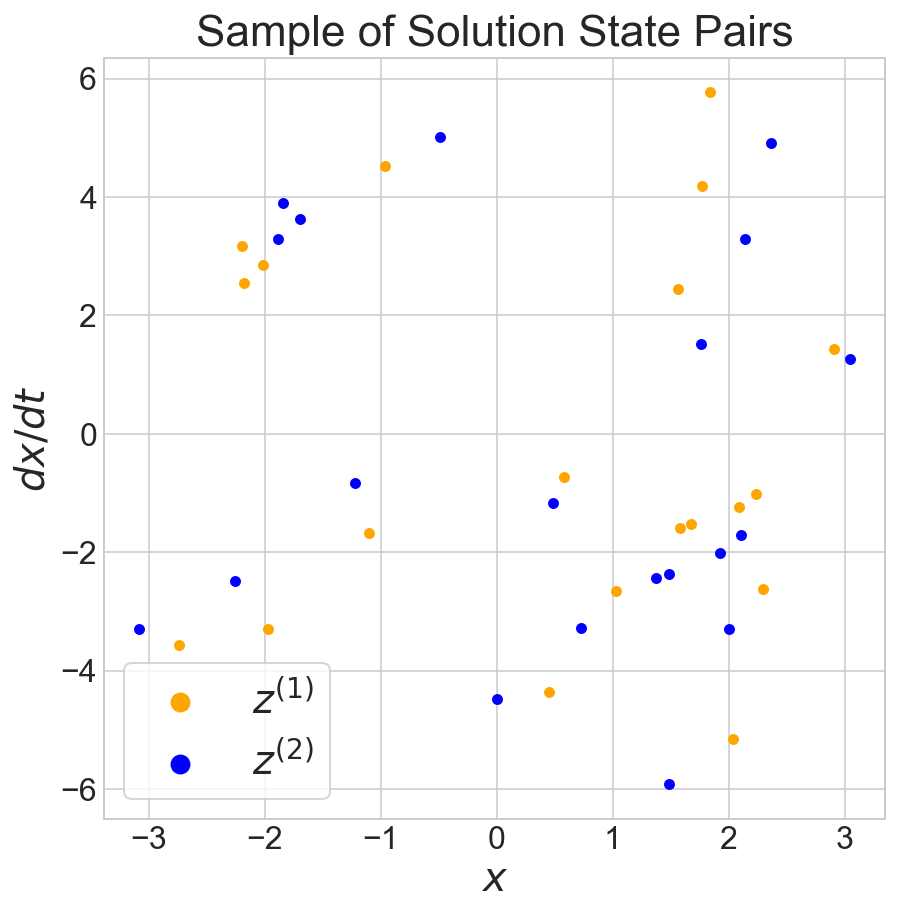

In [7]:
plt.figure(figsize=(7,7))
plt.title("Sample of Solution State Pairs", fontsize=22)
plt.scatter(X_sample[:20,0], X_sample[:20,1], c="orange", s=20, label=r"$z^{(1)}$")
plt.scatter(Y_sample[:20,0], Y_sample[:20,1], c="blue",  s=20, label=r"$z^{(2)}$")
plt.xlabel(r"$x$", fontsize=20)
plt.ylabel(r"$dx/dt$", fontsize=20)
plt.legend(prop={"size":20}, frameon=True, markerscale=2)
plt.show()

In [8]:
X0_arr, XΔ_arr = get_true_vector_field(n_solutions=1000, Δ=0.1, t_end=20)

In [9]:
x, y, u_norm, v_norm, c = get_normalized_vector_coords(X0_arr, XΔ_arr, scale=0.02)

The plot below is used to get an idea of all the possible ways our dyanamical system can evolve over time from different initial conditions. It consists of 1000 different solutions from the ODE solver from $t=0$ to $t=20$. Instead of plotting each solution as a line, it is broken into points seperated by $\Delta=0.1$, where the (very small) arrows point in the direction of motion. 

For example, in regions where the initial velocity is high, the vectors travel along the right or left for a while before settling down into an inward spiral. This corresponds to a pendulum with a high enough initial velocity that it fully rotates around several times before settling into a decaying oscillation. 


*If viewing in a jupyter notebook, double click the figure to get a better view of the individual arrows*

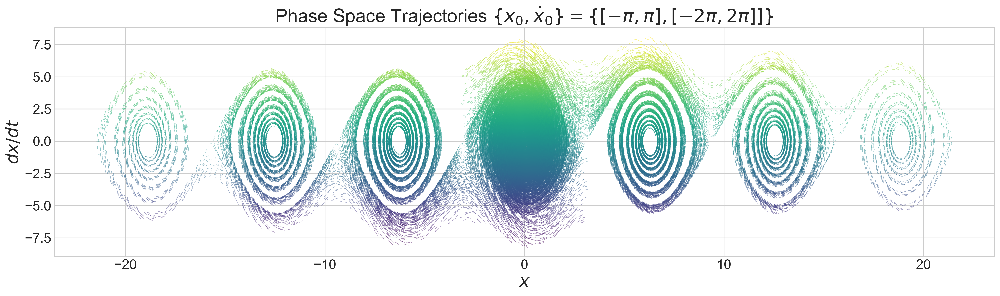

In [10]:
plt.figure(figsize=(20,5), dpi=150)
plt.quiver(x, y, u_norm, v_norm, c, cmap=plt.cm.viridis, 
           pivot="mid", units="width", width=0.0004, scale=3, alpha=0.5)
plt.xlabel(r"$x$", fontsize=20)
plt.ylabel(r"$dx/dt$", fontsize=20)
plt.title("Phase Space Trajectories "
          "$\{x_{0},\dot{x}_{0}\} = \{[-\pi,\pi],[-2\pi,2\pi]] \}$", fontsize=22)
# plt.xlim(-3.14,3.14)
plt.show()

# Neural Network Construction

This section outlines the code for constructing the neural network using plain NumPy.

### Activation Function
The tanh activation function, and the derivative of the activation function used during back propagation. 

In [11]:
def tanh(Z):
    return np.tanh(Z).astype(np.float32)

def d_tanh(Z):
    dZ = 1 - np.tanh(Z)**2
    return dZ

### Loss Function

In [12]:
def mean_squared_error(Y_hat, Y):
    m = Y_hat.shape[1] # number of examples
    cost = (1 / m) * np.sum( (Y - Y_hat)**2 )
    return np.squeeze(cost).astype(np.float32)

### Optimizer

Initial experimentation was done with the standard SGD optimizer used in the paper [1]. However, Adam (Adaptive Moment Estimation) allows for faster convergence [2] and has given overall much better results.  

Adam is a per-parameter adaptive learning rate method. Instead of changing the learning rate globally and equally for all parameters (as is the case with SGD), Adam adaptively tunes the learning rates on a per-parameter basis. It also encorperates a "momentum" term which uses information about the update values of the previous time step in order to "speed up" or "slow down" the gradient descent process - similar to a ball rolling down a hill under the influence of gravity.  

For the parameter set $\theta$, the update rule for Adam is 

$$\theta_{t+1}=\theta_{t}-\frac{\eta \cdot \hat{m}_{t}}{\sqrt{\hat{v}_{t}}+\epsilon}$$

where $\eta$ is the learning rate, $\epsilon$ is a small term preventing zero-division, and

$$\begin{aligned} \hat{m}_{t} &=\frac{m_{t}}{1-\beta_{1}^{t}} \\ \hat{v}_{t} &=\frac{v_{t}}{1-\beta_{2}^{t}} \end{aligned}$$

The parameter $\hat{v}_{t}$ stores an exponentially decaying average of past squared gradients , and $\hat{m}_{t}$ stores an exponentially decaying average of past gradients. $\beta_{1}$ and $\beta_{2}$ are the exponential decay rates, and are set to their default values in TensorFlow of $\beta_{1} = 0.9$ and $\beta_{2} = 0.999$. $v_{t}$ and $m_{t}$ are defined as

$$\begin{aligned} m_{t} &=\left(1-\beta_{1}\right) \nabla J\left(\theta_{t, i}\right)+\beta_{1} m_{t-1} \\ v_{t} &=\left(1-\beta_{2}\right) \left(\nabla J\left(\theta_{t, i}\right) \right)^{2}+\beta_{2} v_{t-1} \end{aligned}$$





*The plain NumPy implimentation of Adam was a bit too difficult to do from scratch, so the `Adam` class below was modified from [this repository](https://github.com/SkalskiP/ILearnDeepLearning.py/blob/master/01_mysteries_of_neural_networks/06_numpy_convolutional_neural_net/src/optimizers/adam.py)*


In [13]:
class Adam:
    """Adaptive Moment Estimation"""
    def __init__(self, lr, β1 = 0.9, β2 = 0.999, eps = 1e-8):
        """
        :param lr - learning rate
        :param beta1 -
        :param beta2 -
        :param eps - small value to avoid zero denominator
        """
        self._m = {}
        self._v = {}
        self._m_hat = {}
        self._v_hat = {}
        self._t = 0
        self._lr = lr
        self._β1 = β1
        self._β2 = β2
        self._eps = eps
        

    def update(self, params_values, grads_values, nn_architecture):
        
        β1t = np.power(self._β1, self._t)
        β2t = np.power(self._β2, self._t)
        
        if len(self._v) == 0 or len(self._m) == 0:
            self._init_moments(grads_values, nn_architecture)
        
        for layer_idx, layer in enumerate(nn_architecture, 1):
            
            w = params_values["W" + str(layer_idx)]
            b = params_values["b" + str(layer_idx)]
            
            dw = grads_values["dW" + str(layer_idx)]        
            db = grads_values["db" + str(layer_idx)]
            
            dw_key, db_key = Adam._get_cache_keys(layer_idx)
            
            # m(t) =  β1 * m(t-1) + (1 - β1) * g(t)
            self._m[dw_key] = self._β1 * self._m[dw_key] + (1 - self._β1) * dw
            self._m[db_key] = self._β1 * self._m[db_key] + (1 - self._β1) * db
            
            # v(t) =  β2 * v(t-1) + (1 - β2) * g(t)^2
            self._v[dw_key] = self._β2 * self._v[dw_key] + (1 - self._β2) * np.square(dw)
            self._v[db_key] = self._β2 * self._v[db_key] + (1 - self._β2) * np.square(db)
            
            # m_hat(t) =  m(t) / (1 - β1^t)
            self._m_hat[dw_key] = self._m[dw_key]/(1.0 - β1t)
            self._m_hat[db_key] = self._m[db_key]/(1.0 - β1t)
            
            # v_hat(t) =  v(t) / (1 - β2^t)
            self._v_hat[dw_key] = self._v[dw_key]/(1.0 - β2t)
            self._v_hat[db_key] = self._v[db_key]/(1.0 - β2t)
            
            # θ(t+1) = θ(t) -  (η * m_hat(t)) / (sqrt(v_hat(t)) + eps)
            dw = self._m_hat[dw_key] / (np.sqrt(self._v_hat[dw_key]) + self._eps)
            db = self._m_hat[db_key] / (np.sqrt(self._v_hat[db_key]) + self._eps)
            
            params_values["W" + str(layer_idx)] = w - self._lr * dw   
            params_values["b" + str(layer_idx)] = b - self._lr * db
            
        return params_values
            
            
    def _init_moments(self, grads_values, nn_architecture):
        
        for layer_idx, layer in enumerate(nn_architecture, 1):
        
            dw = grads_values["dW" + str(layer_idx)]        
            db = grads_values["db" + str(layer_idx)]
            
            dw_key, db_key = Adam._get_cache_keys(layer_idx)
            
            self._m[dw_key] = np.zeros_like(dw)
            self._m[db_key] = np.zeros_like(db)
            self._v[dw_key] = np.zeros_like(dw)
            self._v[db_key] = np.zeros_like(db)
            
            self._m_hat[dw_key] = np.zeros_like(dw)
            self._m_hat[db_key] = np.zeros_like(db)
            self._v_hat[dw_key] = np.zeros_like(dw)
            self._v_hat[db_key] = np.zeros_like(db)
            

    @staticmethod
    def _get_cache_keys(idx):
        """
        :param idx - index of layer
        """
        return f"dw{idx}", f"db{idx}"

### Performance Scheduling

The following class is a callback which will cause the optimizer to reduce it's learning rate after a specified performance metric has not improved for a specified number of epochs. Validation loss is used as the performance metric for the experiments. 

In [14]:
class ReduceLROnPlateau:
    """Does the same thing as tf.keras.callbacks.ReduceLROnPlateau"""
    def __init__(self, patience=100, factor=0.5, min_lr=1e-4):
        # variables for learning rate scheduling
        self.performance_metric = 1e12
        self.wait = 0
        self.patience = patience
        self.factor = factor 
        self.min_lr = min_lr
    
    
    def update(self, cost, optimizer):
       
        if cost < self.performance_metric:
            # reset wait if performance metric improved
            self.performance_metric = cost
            self.wait = 0
        else:
            # increment wait if performance metric did not improve
            self.wait = self.wait + 1
            if (self.wait >= self.patience):
                reduced_lr = optimizer._lr * self.factor
                if (reduced_lr > self.min_lr):
                    optimizer._lr = reduced_lr
                    print(" \n Learning rate decreased to {}".format(optimizer._lr))
                self.wait = 0

### Note on back propagation

The hardest part of the NumPy implementation - by far - was adjusting the backpropagation to account for the skip connection. This was done in a rather tedious way by manually solving the equations for backpropagation by hand. The following sketch was constructed by following this fantastic [video](https://www.youtube.com/watch?v=tIeHLnjs5U8&list=PLZHQObOWTQDNU6R1_67000Dx_ZCJB-3pi&index=4) on backpropagation calculus. 

The drawing is for a simplified version of our neural network, where each layer has a single neuron. It shows the calculations for the derivative of the cost function with respect to the weights of each layer. The derivative of the cost function with respect to the biases can be obtained by a similar calculation. Also, the result below can easily be generalized to a network with multiple neurons per layer. 

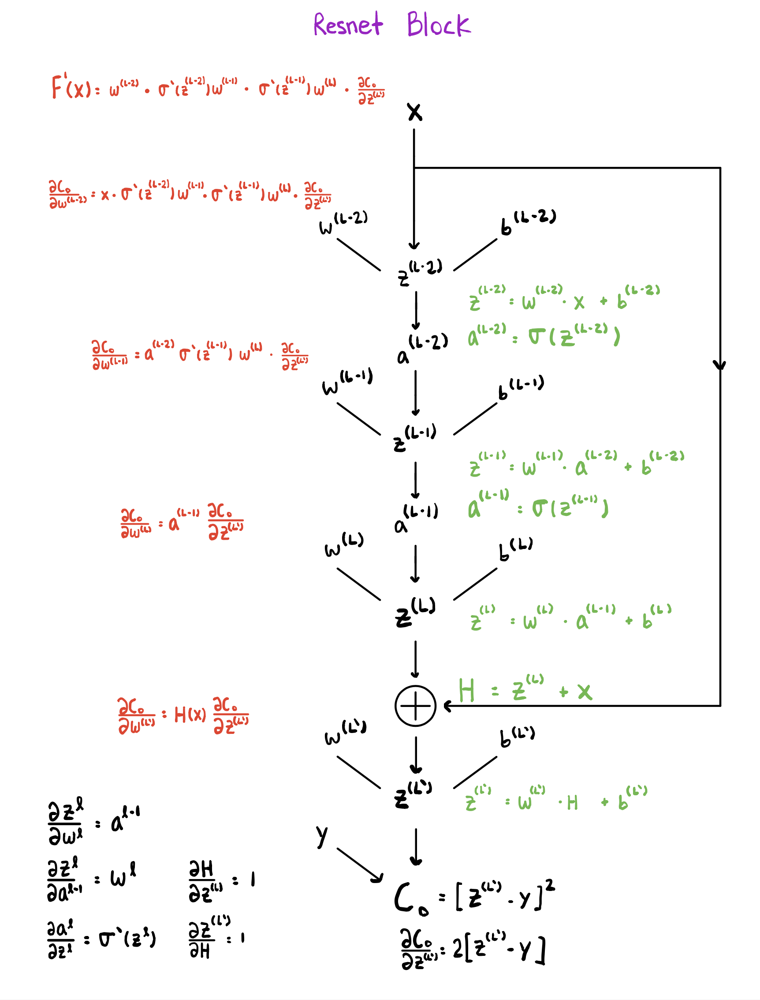

In [15]:
Image(filename='backprop_sketch.png') 

### One Step Residual Neural Network

Putting everything together into a class that defines the model. It includes a few utility functions that are not used in this paper, but were useful for debugging and visualizing.

In [16]:
class OneStepResNet:
    """
        :param nn_architecture    - dictionary that defines each layer of the network
        :param loss_function      - function that used for calculating model cost
        :param optimizer          - instance of an optimizer class Adam() or SGD()
        :param learning_schedule  - instance of the learning schedule class 
                                    ReduceLROnPlateau or (None)
        :param track_gradients    - whether or not to log the gradients w.r.t each layer 
                                    for each epoch
        :param show_predictions   - whether or not to output a live plot of
                                    model predictions during training
    """
    
    def __init__(self, nn_architecture, loss_function, optimizer, 
                 learning_schedule=None, track_gradients=False, show_predictions=False):
        
        self.nn_architecture = nn_architecture
        self.loss_function = loss_function
        self.optimizer = optimizer
        self.learning_schedule = learning_schedule

        # initiation of lists storing the history of metrics calculated
        # during the learning process 
        self.train_cost_history = []
        self.valid_cost_history = []
        self.track_gradients = track_gradients 
        self.show_predictions = show_predictions 
        self.grads_history = {}
        # variables for learning rate scheduling
        self.performance_metric = 1e12
        self.wait = 0
        
        if self.show_predictions:
            t, x, dxdt = generate_damped_pendulum_solution(
                dataset=False, α=0.2, β=8.91, Δ=0.1, t_end=20)
            self.t_true = t
            self.X_true = x
        

    def init_layers(self, seed=99):
        """ Weights are initialized with random Gaussian distribution and biases 
            are initialized with zeros. """
        np.random.seed(seed)
        number_of_layers = len(self.nn_architecture)
        # parameters storage initiation
        params_values = {}
        # iteration over network layers
        for idx, layer in enumerate(self.nn_architecture):
            # we number network layers from 1
            layer_idx = idx + 1
            # extract the number of units in layers
            layer_input_size = layer["input_dim"]
            layer_output_size = layer["output_dim"]
            # initiate the values of the W matrix and vector b for subsequent layers
            params_values['W'+str(layer_idx)] = np.random.randn(
                layer_output_size, layer_input_size) * 1
            params_values['b'+str(layer_idx)] = np.zeros((layer_output_size, 1))

        return params_values
    
    
    def init_grads_history(self):
        """ Used to initialize dictionary that stores gradients. 
            Only called when self.track_gradients=True"""
        for layer_idx_prev, layer in reversed(list(enumerate(self.nn_architecture))):
            layer_idx_curr = layer_idx_prev + 1
            
            self.grads_history["dW" + str(layer_idx_curr)] = []
            self.grads_history["db" + str(layer_idx_curr)] = []

            
    def forward_propagation(self, X, params_values):
        
        # create a temporary memory to store the information needed for a backward step
        memory = {}
        # X vector is the activation for layer 0 
        A_curr = X

        # iteration over network layers
        for idx, layer in enumerate(self.nn_architecture):
            # number network layers from 1
            layer_idx = idx + 1
            
            # transfer the activation from the previous iteration, 
            # add the residual (if it is a "skip" layer)
            if layer["activation"] is "skip":
                A_prev = A_curr + X
            else:
                A_prev = A_curr
                
            # extract W for the current layer
            W_curr = params_values["W" + str(layer_idx)]
            # extract b for the current layer
            b_curr = params_values["b" + str(layer_idx)]
            # calculate the input value for the activation function
            Z_curr = np.dot(W_curr, A_prev) + b_curr
            
            # calculate the activation for the current layer 
            if layer["activation"] is not "skip":
                A_curr = tanh(Z_curr)
            else:
                A_curr = Z_curr
            
            # save calculated values in the memory
            if layer["activation"] is not "skip":
                memory["A" + str(idx)] = A_prev
                
            memory["Z" + str(layer_idx)] = Z_curr

        # return prediction vector and a dictionary containing intermediate values
        return A_curr, memory
    

    def backward_propagation(self, Y_hat, Y, memory, params_values):
        grads_values = {}

        # number of examples
        m = Y.shape[1]
        # a hack ensuring the same shape of the prediction vector and labels vector
        Y = Y.reshape(Y_hat.shape)

        # initiate gradient descent algorithm (Derivative of mse loss function)
        dCost = 2*(Y_hat - Y)
        
        dA_prev = dCost

        for layer_idx_prev, layer in reversed(list(enumerate(self.nn_architecture))):
            # we number network layers from 1
            layer_idx_curr = layer_idx_prev + 1
            
            dA_curr = dA_prev

            # extraction of the activation function for the current layer
            if layer["activation"] is not "skip":
                A_prev = memory["A" + str(layer_idx_prev)]
                
            Z_curr = memory["Z" + str(layer_idx_curr)]

            W_curr = params_values["W" + str(layer_idx_curr)]
            b_curr = params_values["b" + str(layer_idx_curr)]
            
            if layer["activation"] == "skip":
                # Last layer has no activation function, 
                # so slightly different back prop
                dZ_curr = dCost 
                # derivative of the matrix W
                dW_curr = np.dot(dZ_curr, Z_curr.T) / m
                # derivative of the vector b
                db_curr = np.sum(dZ_curr, axis=1, keepdims=True) / m
                # derivative of the matrix A_prev
                dA_prev = np.dot(W_curr.T, dZ_curr)
            else:
                # calculate the activation function derivative 
                dZ_curr = dA_curr * d_tanh(Z_curr)
                # derivative of the matrix W
                dW_curr = np.dot(dZ_curr, A_prev.T) / m
                # derivative of the vector b
                db_curr = np.sum(dZ_curr, axis=1, keepdims=True) / m
                # derivative of the matrix A_prev
                dA_prev = np.dot(W_curr.T, dZ_curr)
                
            grads_values["dW" + str(layer_idx_curr)] = dW_curr.astype(np.float32)
            grads_values["db" + str(layer_idx_curr)] = db_curr.astype(np.float32)

        return grads_values
    
    
    def log_gradients(self, grads_values):
        """Only used if self.track_gradients=True"""
        for layer_idx_prev, layer in reversed(list(enumerate(self.nn_architecture))):
            layer_idx_curr = layer_idx_prev + 1
            
            dW = grads_values["dW" + str(layer_idx_curr)]
            db = grads_values["db" + str(layer_idx_curr)]
            
            self.grads_history["dW" + str(layer_idx_curr)].append(np.mean(dW, axis=0))
            self.grads_history["db" + str(layer_idx_curr)].append(np.mean(db, axis=0))
                            

    def train(self, X_train, Y_train, epochs, X_valid, Y_valid, batch_size=10):
        
        # initiate neural net parameters
        params_values = self.init_layers()
        
        steps_per_epoch = int(len(X_train) // batch_size)
        
        if self.track_gradients:
            self.init_grads_history()
        
        # need to transpose the arrays for the `resample()` function
        X_valid = np.transpose(X_valid)
        Y_valid = np.transpose(Y_valid)
            
        # training loop ...
        for i in range(epochs):
            # Randomly shuffle the data at the beginning of each epoch
            X_train_, Y_train_ = resample(X_train, Y_train, n_samples=None)
            
            # transpose the data back into "correct" shape for our calculations
            X_train_ = np.transpose(X_train_)
            Y_train_ = np.transpose(Y_train_)
            
            epoch_train_cost = np.zeros((steps_per_epoch,))
            
            self.optimizer._t += 1

            # iterate over batches of training data
            for idx, (X_batch, Y_batch) in enumerate(generate_batches(
                                                X_train_, Y_train_, batch_size)):
                
                # step forward
                Y_hat, cache = self.forward_propagation(X_batch, params_values)

                # calculate batch metrics and save them in history
                cost = self.loss_function(Y_hat, Y_batch)
                epoch_train_cost[idx] = cost

                # step backward - calculate gradients
                grads_values = self.backward_propagation(
                    Y_hat, Y_batch, cache, params_values)
                
                if self.track_gradients:
                    self.log_gradients(grads_values)
            
                # update model state
                params_values = self.optimizer.update(
                    params_values, grads_values, self.nn_architecture)
                
            # get predictions on full validation set
            Y_hat, cache = self.forward_propagation(X_valid, params_values)

            # calculate epoch metrics and save them in history
            epoch_valid_cost = self.loss_function(Y_hat, Y_valid)               
            epoch_mean_train_cost = np.mean(epoch_train_cost)
            self.train_cost_history.append(epoch_mean_train_cost)
            self.valid_cost_history.append(epoch_valid_cost)
            
            if self.learning_schedule is not None:
                self.learning_schedule.update(epoch_valid_cost, self.optimizer)
                
            if self.show_predictions:
                self.plot_trajectory(params_values=params_values)
                

            print("\r Epoch: {:05} - Train cost: {:.8f} - Valid cost: {:.8f}".format(i, 
                epoch_mean_train_cost, epoch_valid_cost), end='')
            
        return params_values
    
    
    def predict(self, X, params_values):
        """Prediction on a single datapoint"""
        y , _ = self.forward_propagation(np.expand_dims(X, axis=0).T, params_values)
        return y
    
    
    def predict_trajectory(self, params, Δ=0.1, t_end=20):
        """Used if self.show_predictions=True"""
        t_steps = np.arange(0,t_end, Δ)
        X_pred = np.zeros((len(t_steps), 2))

        x_0 = np.array([-1.193, -3.876])
        x_Δ = np.array([-1.193, -3.876])

        for i in range(0, len(t_steps)):
            x_0 = x_Δ
            x_Δ = self.predict(x_0, params)
            x_Δ = np.squeeze(x_Δ.T)
            X_pred[i] = x_Δ   

        t_steps = t_steps + Δ
        return t_steps, X_pred
    
    
    def plot_trajectory(self, params_values):
        """ 
        Plots a solution trajectory every epoch to show the learning process. 
        Used if self.show_predictions=True
        """
        t_end = 20
        t_steps, X_pred = self.predict_trajectory(
            params=params_values, Δ=0.1, t_end=t_end)  
        COLOUR1 = (0.99, 0.72, 0.01, 1.0)

        plt.cla()
        plt.clf()
        plt.close()
        plt.figure(figsize=(16,8))
        plt.title("Position", fontsize=22)
        plt.plot(self.t_true, self.X_true, "-", c="r", linewidth=3, label="x(t)")
        plt.plot(t_steps, X_pred[:,0], ".", c="b", markersize=10, label="x(t) Predicted")
        t_idx = [int(tx) for tx in (len(self.t_true)/t_end)*t_steps-1]
        plt.fill_between(t_steps, X_pred[:,0], self.X_true[t_idx], 
                         color=COLOUR1, alpha=0.5)
        plt.legend(prop={"size":16}, loc="upper right")
        plt.ylim([-2.5, 2.5])
        plt.xlim([-1,21])
        
        clear_output(wait=True)
        display.display(plt.gcf())

### Defining Model Architecture

The model architecture is defined using the dictionary below. Using more than 35 neurons per layer or using more than four layers causes gradients to explode. This is an issue that hasn't been resolved. However, the current implimentation works well and has the same number of layers and neurons as in the original paper. 

In [17]:
NN_ARCHITECTURE = [
    {"input_dim": 2, "output_dim": 30,"activation": "tanh"},
    {"input_dim": 30,"output_dim": 30,"activation": "tanh"},
    {"input_dim": 30,"output_dim": 2, "activation": "tanh"},
    {"input_dim": 2, "output_dim": 2, "activation": "skip"},
]

# Model Training and Evaluation

### Setup

To prevent overfitting, the dataset consists of 20 times the number of datapoints as the number of model parameters. There are 1,088 model parameters (obtained using the `model.summary()` function in TensorFlow), so we construct a dataset of 20,000 datapoints for training and 5,000 for validation. Additionally, the training dataset is divided into mini-batches of size 10 that are reshuffled at the end of each epoch. 

The learning rate schedule was configued differently for training on data with noise and no noise. For the noiseless data, it was important to keep the minimum learning rate at around $1e-5$, since anything lower would cause overfitting. And for training on data with noise, a minimum learning rate of around $1e-7$ has given the best results without overfitting. 

# NumPy Implimentation

## Experiment 1: No added noise

In [18]:
X_v1, Y_v1 = generate_damped_pendulum_solution(
    N_SAMPLES=25000, α=0.2, β=8.91, Δ=0.1, dataset=True, noise=0.0)
X_train_v1, X_valid_v1, y_train_v1, y_valid_v1 = train_test_split(
    X_v1, Y_v1, test_size=0.2, random_state=42)

 generating 25000 / 25000

In [19]:
numpy_model_v1 = OneStepResNet(
    nn_architecture = NN_ARCHITECTURE,
    loss_function = mean_squared_error,
    optimizer = Adam(lr = 0.001),
    learning_schedule = ReduceLROnPlateau(patience=25, factor=0.5, min_lr=1e-5),
    track_gradients = False,
    show_predictions = False,
)

In [20]:
start = time.time()

numpy_model_v1_params_values = numpy_model_v1.train(
    X_train = X_train_v1,
    Y_train = y_train_v1, 
    epochs = 500, 
    X_valid = X_valid_v1,
    Y_valid = y_valid_v1,
    batch_size = 10,
)

end = time.time()
print("\n Time: {:.2f} minutes".format((end-start)/60))

 Epoch: 00109 - Train cost: 0.00037446 - Valid cost: 0.00022560 
 Learning rate decreased to 0.0005
 Epoch: 00154 - Train cost: 0.00018463 - Valid cost: 0.00018908 
 Learning rate decreased to 0.00025
 Epoch: 00207 - Train cost: 0.00011325 - Valid cost: 0.00012619 
 Learning rate decreased to 0.000125
 Epoch: 00316 - Train cost: 0.00007312 - Valid cost: 0.00007341 
 Learning rate decreased to 6.25e-05
 Epoch: 00363 - Train cost: 0.00005760 - Valid cost: 0.00005741 
 Learning rate decreased to 3.125e-05
 Epoch: 00426 - Train cost: 0.00004981 - Valid cost: 0.00004794 
 Learning rate decreased to 1.5625e-05
 Epoch: 00499 - Train cost: 0.00004532 - Valid cost: 0.00004889
 Time: 7.45 minutes


*To run this notebook with pre-trained weights, comment out the the `np.save` line and uncomment the `np.load` lines*

In [20]:
np.save("numpy_model_v1_params_values.npy", numpy_model_v1_params_values)

# numpy_model_v1_params_values = np.load(
#     "numpy_model_v1_params_values.npy", allow_pickle=True)
# numpy_model_v1_params_values = numpy_model_v1_params_values[()]

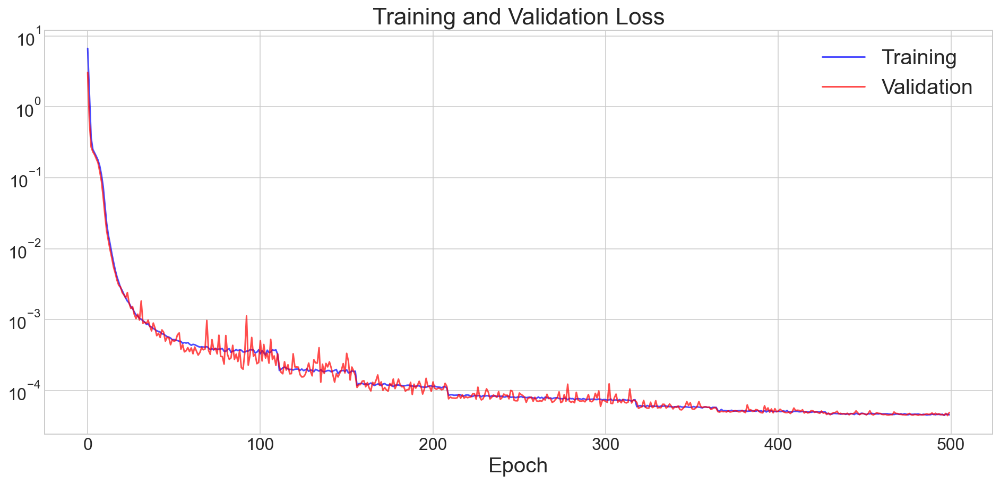

In [22]:
plot_history(numpy_model_v1)

The alignment of the training and validation curves throughout the training process indicates the model is generalizing well to new data and not overfitting. Additionally, we see the sharp drops in training and validation loss are caused by reductions in the learning rate. 



### Note on Model Predictions

Predictions of the time evolution of the damped pendulum are generate by the following iterative process:
- The model is given a set of initial conditions $\left[ x(0), \ \dot{x}(0) \right]$ and predicts the state at $\left[ x(\Delta), \ \dot{x}(\Delta) \right]$.
- The prediction $\left[ x(\Delta), \ \dot{x}(\Delta) \right]$ is then fed back into the model to predict the state at the next timestep $\left[ x(2\Delta), \ \dot{x}(2\Delta) \right]$
- This process - of using the output at one timestep to predict the state at the next timestep
    is repeated until the desired final timestep is reached. 

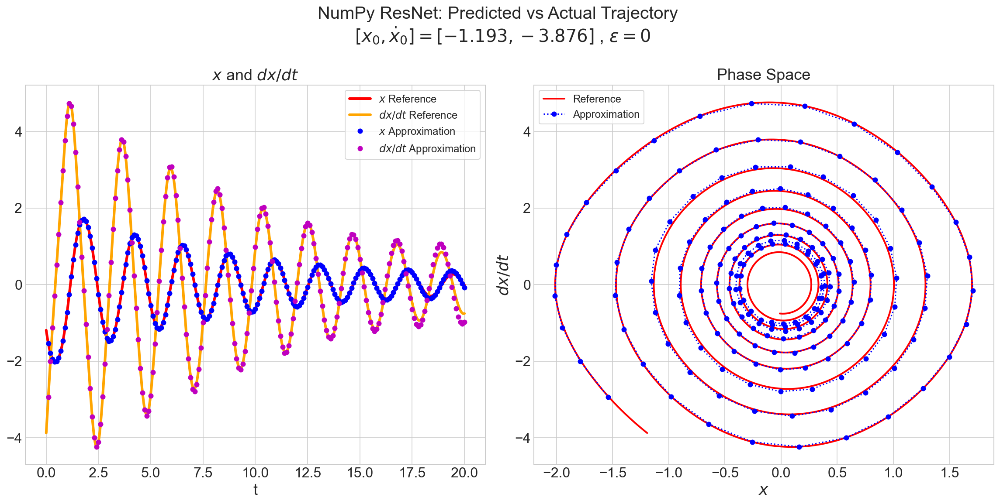

In [21]:
t_steps, X_pred = predict_solution(
    model=numpy_model_v1,params_values=numpy_model_v1_params_values,Δ=0.1,t_end=20)  
t, x, dxdt = generate_damped_pendulum_solution(
    dataset=False, α=0.2, β=8.91, Δ=0.1, t_end=20)

plot_trajectory(t, t_steps, x, dxdt, X_pred, 
    title="NumPy ResNet: Predicted vs Actual Trajectory \n "
    "$[x_{0}, \dot{x}_{0}] = [-1.193, -3.876]$ , $\epsilon=0$"
)

For noiseless training data, the sample predicted trajectory above aligns extremely well with the reference trajectory. 

To get a better understanding of how well the model performs overall, the code below generates 5000 predicted and reference trajectories over a range of different initial conditions. This illustrates an important shortcoming of the model - when the initial velocity is high enough to cause the pendulum to fully rotate around, the model fails completely. The pendulum motion drifts far to the left or right, and eventually settles without oscillating. This is also shown by the average error leveling off at a constant value. 

In [22]:
N_predictions = 5000

t1, t_steps1, X_true_arr1, X_pred_arr1 = predict_multiple_solutions(
    n_solutions = N_predictions,
    model = numpy_model_v1,
    params_values = numpy_model_v1_params_values,
    Δ = 0.1,
    t_end = 20
) 

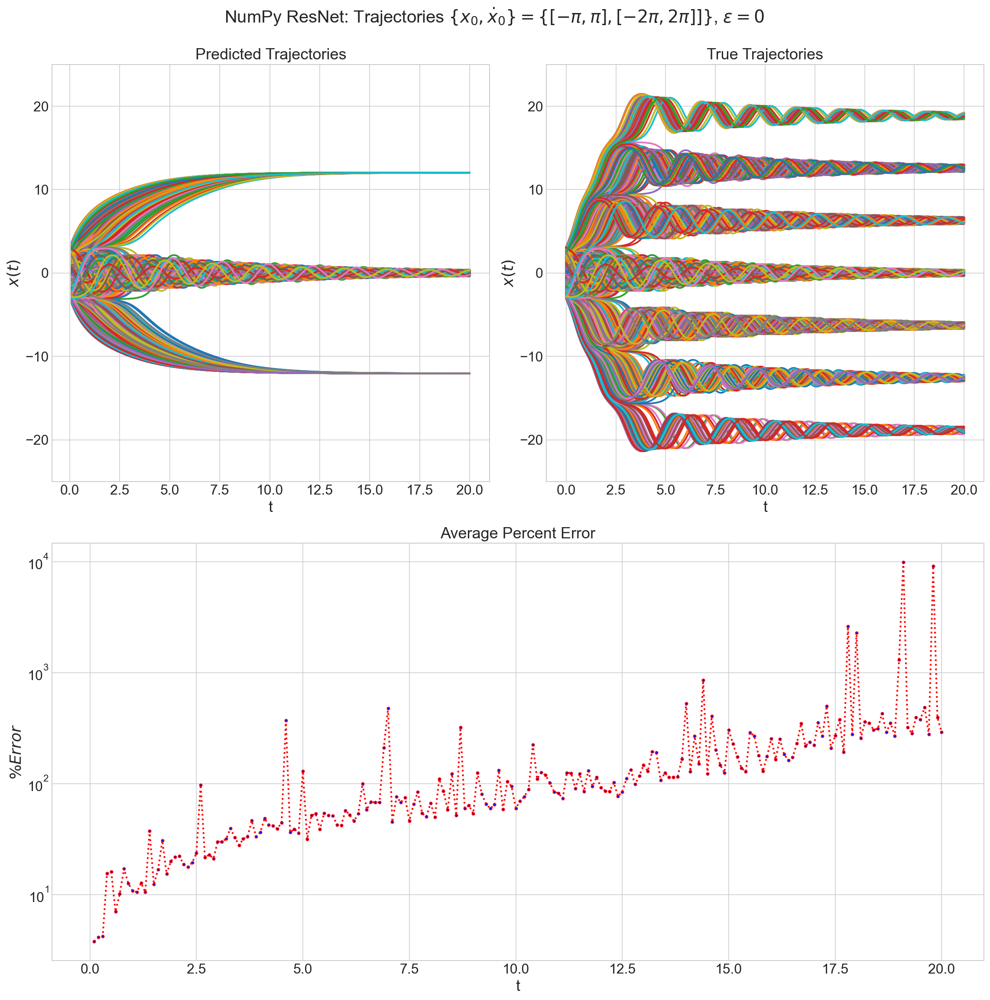

In [23]:
plot_multiple_trajectories(
    t1, t_steps1, X_true_arr1, X_pred_arr1, n_samples=N_predictions, up_ylim=[-25,25],
    title="NumPy ResNet: Trajectories "
    "$\{x_{0},\dot{x}_{0}\} = \{[-\pi,\pi],[-2\pi,2\pi]] \}$, $\epsilon = 0$"
)

## Experiment 2: Added Noise $\epsilon = 0.05$

In [24]:
X_v2, Y_v2 = generate_damped_pendulum_solution(
    N_SAMPLES=25000, α=0.2, β=8.91, Δ=0.1, dataset=True, noise=0.05)
X_train_v2, X_valid_v2, y_train_v2, y_valid_v2 = train_test_split(
    X_v2, Y_v2, test_size=0.2, random_state=42)

 generating 25000 / 25000

In [25]:
numpy_model_v2 = OneStepResNet(
    nn_architecture = NN_ARCHITECTURE,
    loss_function = mean_squared_error,
    optimizer = Adam(lr = 0.001),
    learning_schedule = ReduceLROnPlateau(patience=25, factor=0.5, min_lr=1e-7),
    track_gradients = False,
    show_predictions = False,
)

In [28]:
start = time.time()

numpy_model_v2_params_values = numpy_model_v2.train(
    X_train = X_train_v2,
    Y_train = y_train_v2, 
    epochs = 500, 
    X_valid = X_valid_v2,
    Y_valid = y_valid_v2,
    batch_size = 10,
)

end = time.time()
print("\n Time: {:.2f} minutes".format((end-start)/60))

 Epoch: 00145 - Train cost: 0.00487826 - Valid cost: 0.00512160 
 Learning rate decreased to 0.0005
 Epoch: 00178 - Train cost: 0.00434534 - Valid cost: 0.00440665 
 Learning rate decreased to 0.00025
 Epoch: 00226 - Train cost: 0.00417269 - Valid cost: 0.00416011 
 Learning rate decreased to 0.000125
 Epoch: 00258 - Train cost: 0.00396398 - Valid cost: 0.00409449 
 Learning rate decreased to 6.25e-05
 Epoch: 00296 - Train cost: 0.00397434 - Valid cost: 0.00402374 
 Learning rate decreased to 3.125e-05
 Epoch: 00327 - Train cost: 0.00390099 - Valid cost: 0.00395805 
 Learning rate decreased to 1.5625e-05
 Epoch: 00356 - Train cost: 0.00391082 - Valid cost: 0.00395130 
 Learning rate decreased to 7.8125e-06
 Epoch: 00404 - Train cost: 0.00388394 - Valid cost: 0.00393874 
 Learning rate decreased to 3.90625e-06
 Epoch: 00424 - Train cost: 0.00384165 - Valid cost: 0.00395406 
 Learning rate decreased to 1.953125e-06
 Epoch: 00444 - Train cost: 0.00390362 - Valid cost: 0.00393700 
 Learnin

In [26]:
np.save("numpy_model_v2_params_values.npy", numpy_model_v2_params_values)

# numpy_model_v2_params_values = np.load(
#     "numpy_model_v2_params_values.npy", allow_pickle=True)
# numpy_model_v2_params_values = numpy_model_v2_params_values[()]

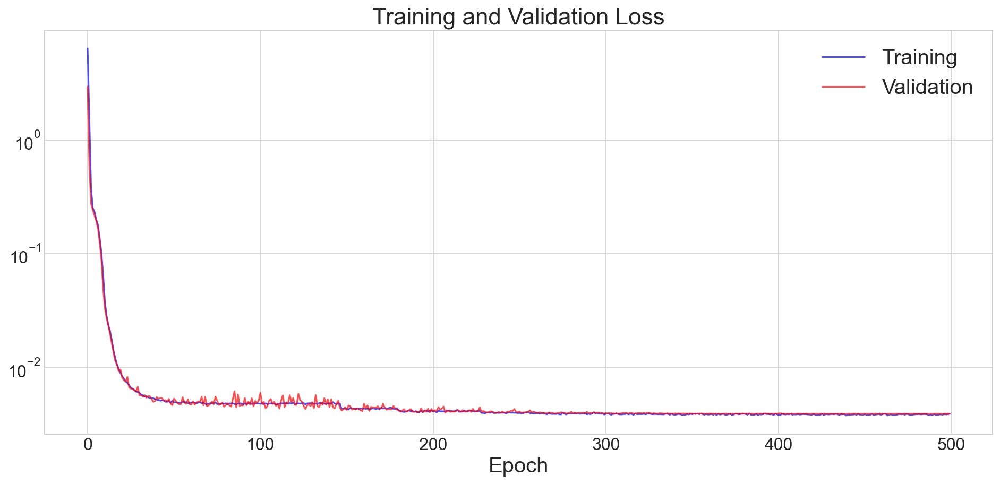

In [30]:
plot_history(numpy_model_v2)

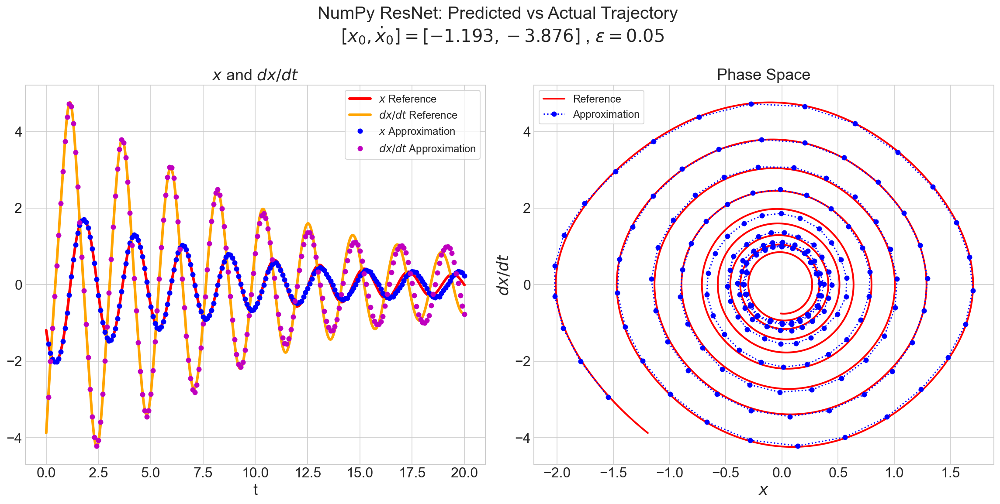

In [27]:
t_steps, X_pred = predict_solution(
    model=numpy_model_v2,params_values=numpy_model_v2_params_values,Δ=0.1,t_end=20)  
t, x, dxdt = generate_damped_pendulum_solution(
    dataset=False, α=0.2, β=8.91, Δ=0.1, t_end=20)

plot_trajectory(t, t_steps, x, dxdt, X_pred,
    title="NumPy ResNet: Predicted vs Actual Trajectory \n "
    "$[x_{0}, \dot{x}_{0}] = [-1.193, -3.876]$ , $\epsilon=0.05$"
)

The added noise introduces some error in the model, although the predicted trajectory still aligns well with the reference trajectory. 

In [28]:
N_predictions = 5000

t2, t_steps2, X_true_arr2, X_pred_arr2 = predict_multiple_solutions(
    n_solutions = N_predictions,
    model = numpy_model_v2,
    params_values = numpy_model_v2_params_values,
    Δ = 0.1,
    t_end = 20
) 

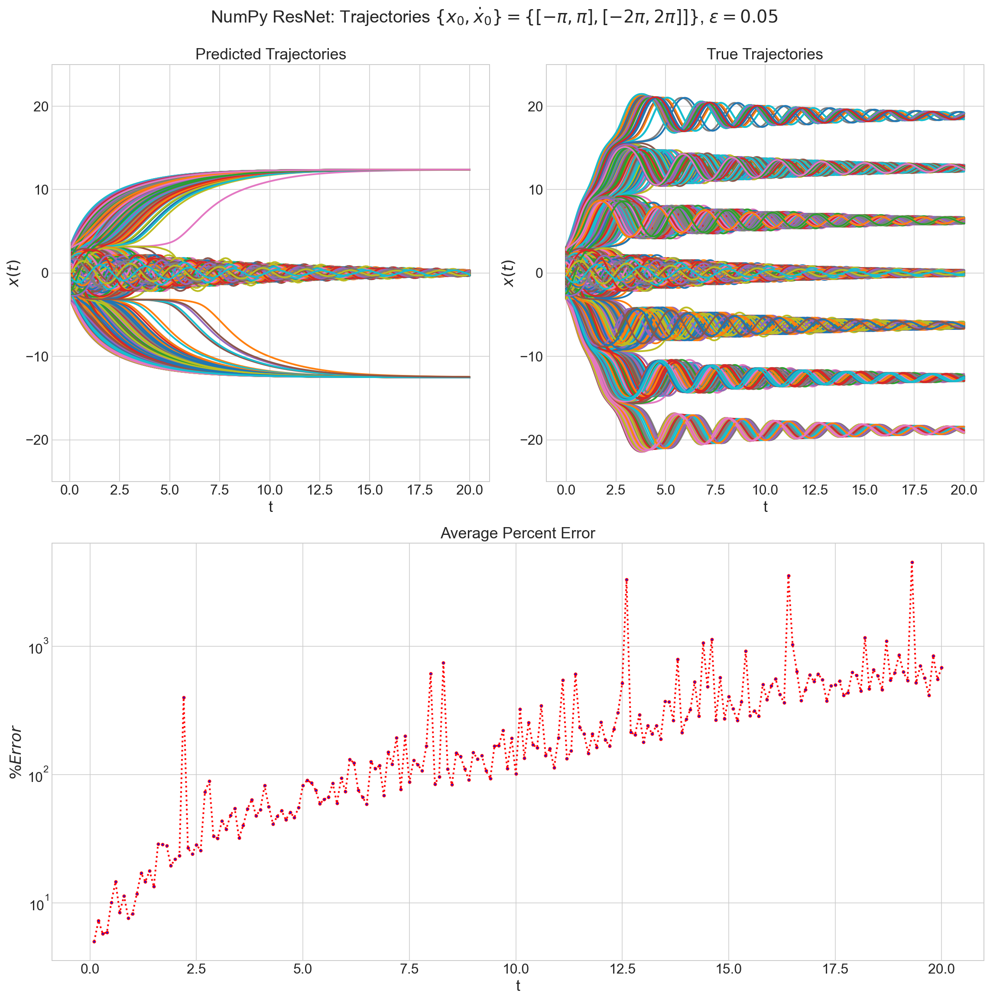

In [29]:
plot_multiple_trajectories(
    t2, t_steps2, X_true_arr2, X_pred_arr2, n_samples=N_predictions, up_ylim=[-25,25],
    title="NumPy ResNet: Trajectories "
    "$\{x_{0},\dot{x}_{0}\} = \{[-\pi,\pi],[-2\pi,2\pi]]\}$, $\epsilon = 0.05$"
)

## Keras Implimentation

In [30]:
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import callbacks

In [31]:
def resnet_block(input_dim):
    inputs = layers.Input(shape=(input_dim,))
    
    x = layers.Dense(30, activation="tanh", 
              kernel_initializer='random_normal', bias_initializer='zeros')(inputs)
    x = layers.Dense(30, activation="tanh", 
              kernel_initializer='random_normal', bias_initializer='zeros')(x)
    x = layers.Dense(2,  activation="tanh", 
              kernel_initializer='random_normal', bias_initializer='zeros')(x)
    x = layers.Add()([x, inputs])
    
    outputs = layers.Dense(
        2, kernel_initializer='random_normal', bias_initializer='zeros')(x)
    
    model =  keras.Model(inputs=inputs, outputs=outputs)   
    
    model.compile(
        loss=keras.losses.MeanSquaredError(), 
        optimizer=keras.optimizers.Adam(learning_rate=0.001), 
    )

    return model

## Keras: No Noise

In [32]:
K.clear_session()

keras_model_v1 = resnet_block(input_dim=2)

Useful table showing the number of model parameters

In [33]:
keras_model_v1.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 2)]          0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 30)           90          input_1[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 30)           930         dense[0][0]                      
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 2)            62          dense_1[0][0]                    
______________________________________________________________________________________________

Visual diagram of the model architecture

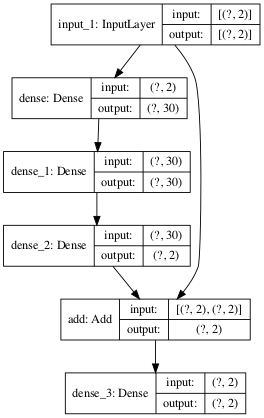

In [34]:
plot_model(keras_model_v1, show_shapes=True, dpi=64)

The TensorFlow `tf.data.Dataset` API is used to continuously shuffle batches of data during training using the `repeat()` function. 

In [35]:
TEST_SIZE = 0.2
TRAIN_LENGTH = X_train_v1.shape[0]
BATCH_SIZE = 10
BUFFER_SIZE = TRAIN_LENGTH
STEPS_PER_EPOCH = int(TRAIN_LENGTH // BATCH_SIZE)
VALIDATION_STEPS = int((X_valid_v1.shape[0])//BATCH_SIZE)

train = tf.data.Dataset.from_tensor_slices((X_train_v1, y_train_v1))
valid = tf.data.Dataset.from_tensor_slices((X_valid_v1, y_valid_v1))

train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)

In [36]:
start = time.time()

reduce_lr = callbacks.ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5, 
        patience=100, 
        min_lr=1e-5, 
        verbose=2
)

history = keras_model_v1.fit(
    train_dataset, 
    epochs=500, 
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_steps=VALIDATION_STEPS,
    validation_data = valid_dataset,
    verbose=1, 
    callbacks=[reduce_lr]
)

end = time.time()
print("\n Time: {:.2f} minutes".format((end-start)/60))

In [37]:
keras_model_v1.save_weights("keras_model_v1.h5")
# keras_model_v1.load_weights("keras_model_v1.h5")

The learning curves for Keras aren't as smooth as the NumPy version, since it tracks the metrics only for the final batch during each epoch, rather than the average of the metrics over the entire epoch. 

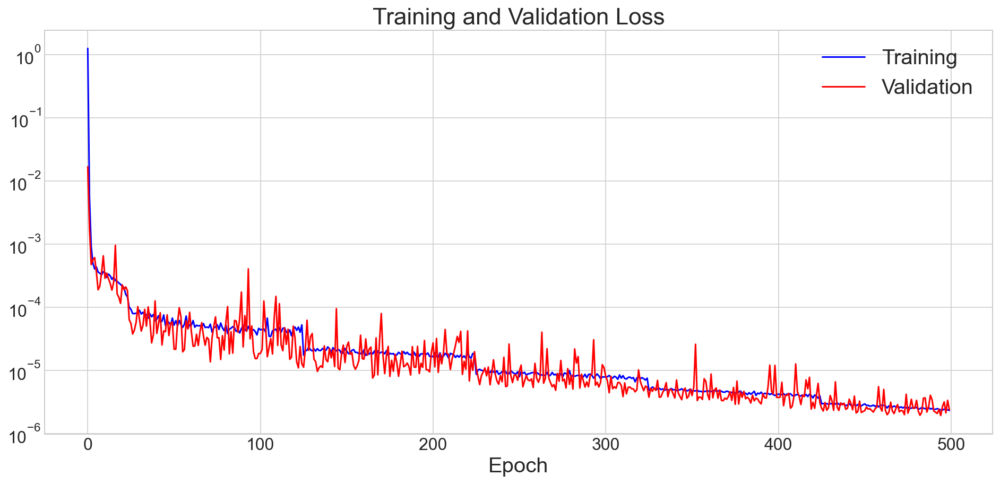

In [42]:
plot_keras_history(history)

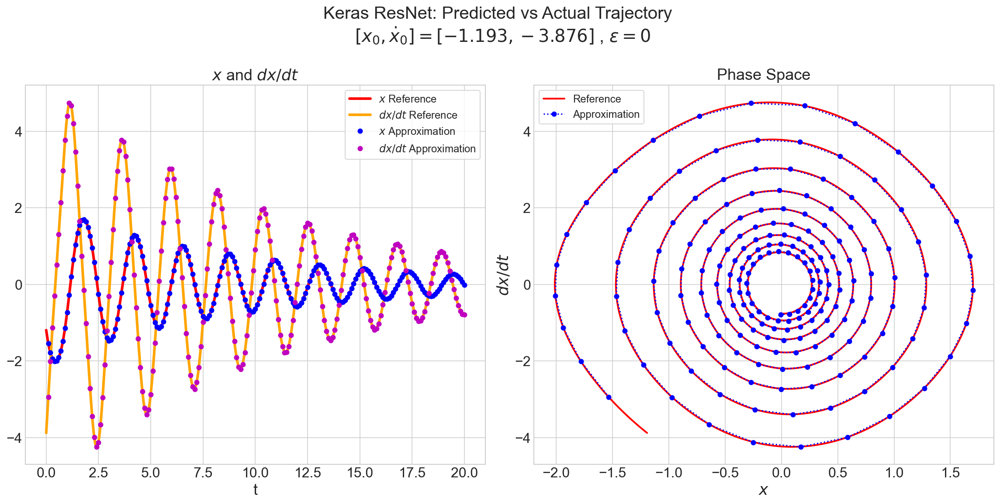

In [38]:
t_steps, X_pred = predict_keras_solution(model=keras_model_v1, Δ=0.1, t_end=20)  
t, x, dxdt = generate_damped_pendulum_solution(
    dataset=False, α=0.2, β=8.91, Δ=0.1, t_end=20)

plot_trajectory(t, t_steps, x, dxdt, X_pred,
    title="Keras ResNet: Predicted vs Actual Trajectory \n "
    "$[x_{0}, \dot{x}_{0}] = [-1.193, -3.876]$ , $\epsilon=0$"
)

In [39]:
N_predictions = 5000

t3, t_steps3, X_true_arr3, X_pred_arr3 = predict_multiple_solutions_keras(
    n_solutions = N_predictions,
    model = keras_model_v1,
    Δ = 0.1,
    t_end = 20
) 

 Stepping 200 / 200

Notice the huge oscillations in the predicted trajectories

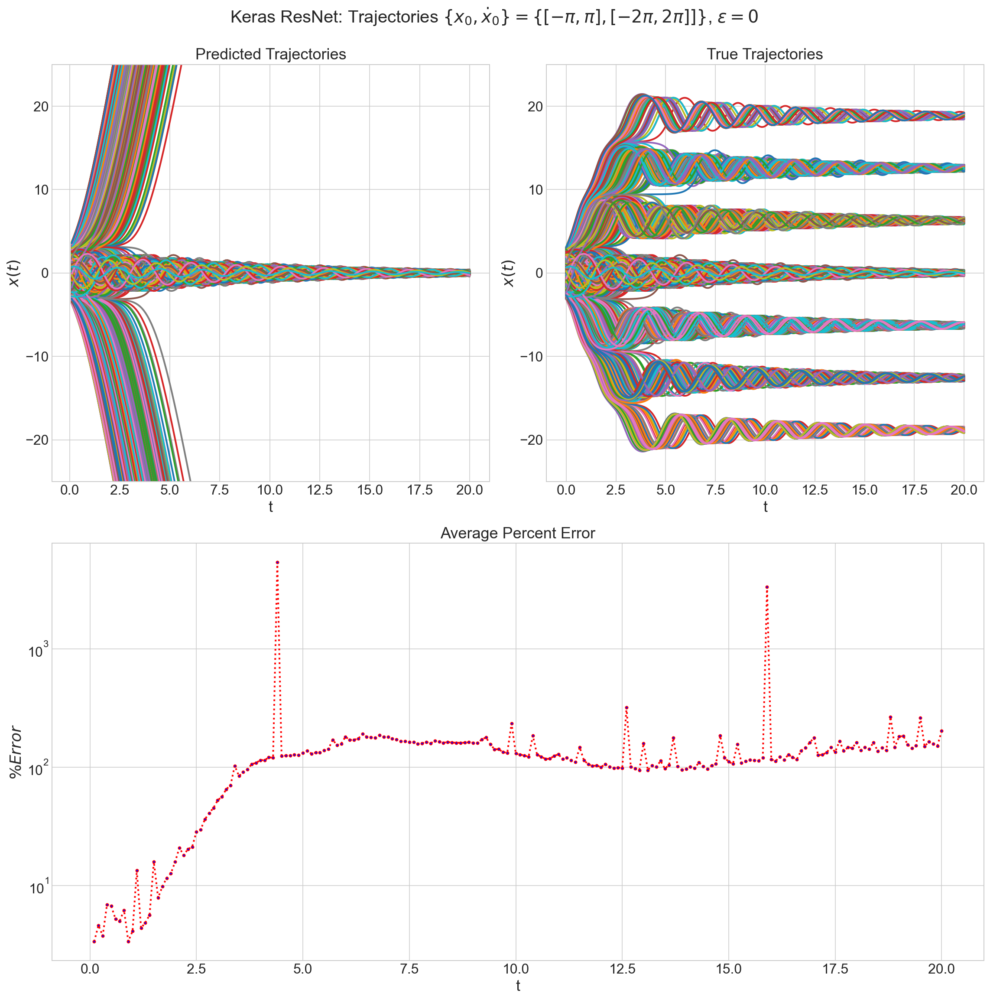

In [40]:
plot_multiple_trajectories(
    t3, t_steps3, X_true_arr3, X_pred_arr3, n_samples=N_predictions, up_ylim=[-25,25],
    title="Keras ResNet: Trajectories "
    "$\{x_{0},\dot{x}_{0}\} = \{[-\pi,\pi],[-2\pi,2\pi]]\}$, $\epsilon = 0$"
)

## Keras: Added Noise $\epsilon = 0.05$

In [41]:
K.clear_session()

keras_model_v2 = resnet_block(input_dim=2)

In [42]:
train = tf.data.Dataset.from_tensor_slices((X_train_v2, y_train_v2))
valid = tf.data.Dataset.from_tensor_slices((X_valid_v2, y_valid_v2))

train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)

In [43]:
start = time.time()

reduce_lr = callbacks.ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5, 
        patience=100, 
        min_lr=1e-7, 
        verbose=2
)

history = keras_model_v2.fit(
    train_dataset, 
    epochs=500, 
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_steps=VALIDATION_STEPS,
    validation_data = valid_dataset,
    verbose=1, 
    callbacks=[reduce_lr]
)

end = time.time()
print("\n Time: {:.2f} minutes".format((end-start)/60))

In [44]:
keras_model_v2.save_weights("keras_model_v2.h5")
# keras_model_v2.load_weights("keras_model_v2.h5")

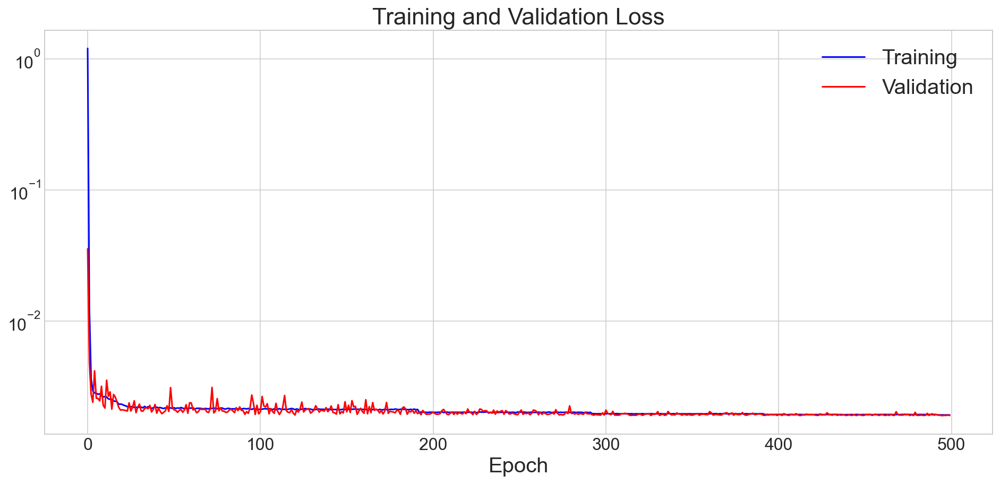

In [50]:
plot_keras_history(history)

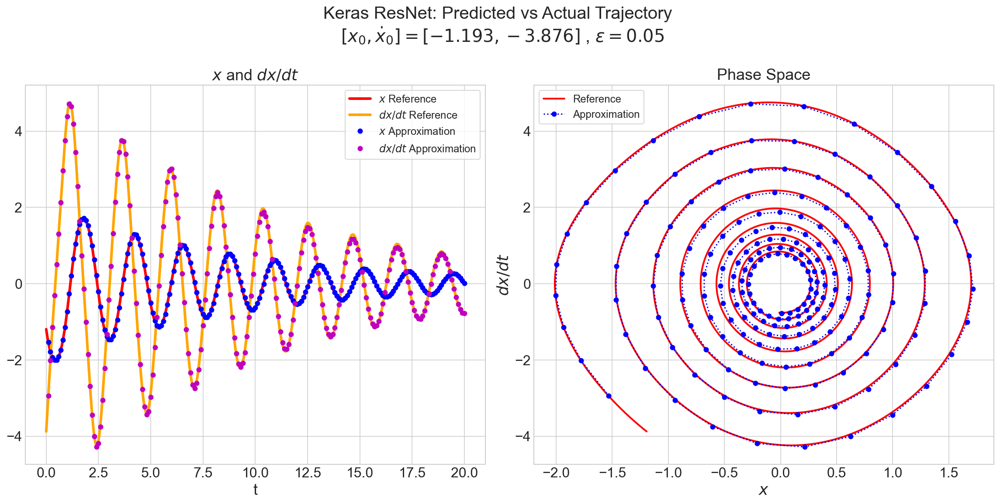

In [45]:
t_steps, X_pred = predict_keras_solution(model=keras_model_v2, Δ=0.1, t_end=20)  
t, x, dxdt = generate_damped_pendulum_solution(
    dataset=False, α=0.2, β=8.91, Δ=0.1, t_end=20)

plot_trajectory(t, t_steps, x, dxdt, X_pred,
    title="Keras ResNet: Predicted vs Actual Trajectory \n "
    "$[x_{0}, \dot{x}_{0}] = [-1.193, -3.876]$ , $\epsilon=0.05$"
)

In [46]:
N_predictions = 5000

t4, t_steps4, X_true_arr4, X_pred_arr4 = predict_multiple_solutions_keras(
    n_solutions = N_predictions,
    model = keras_model_v2,
    Δ = 0.1,
    t_end = 20
) 

 Stepping 200 / 200

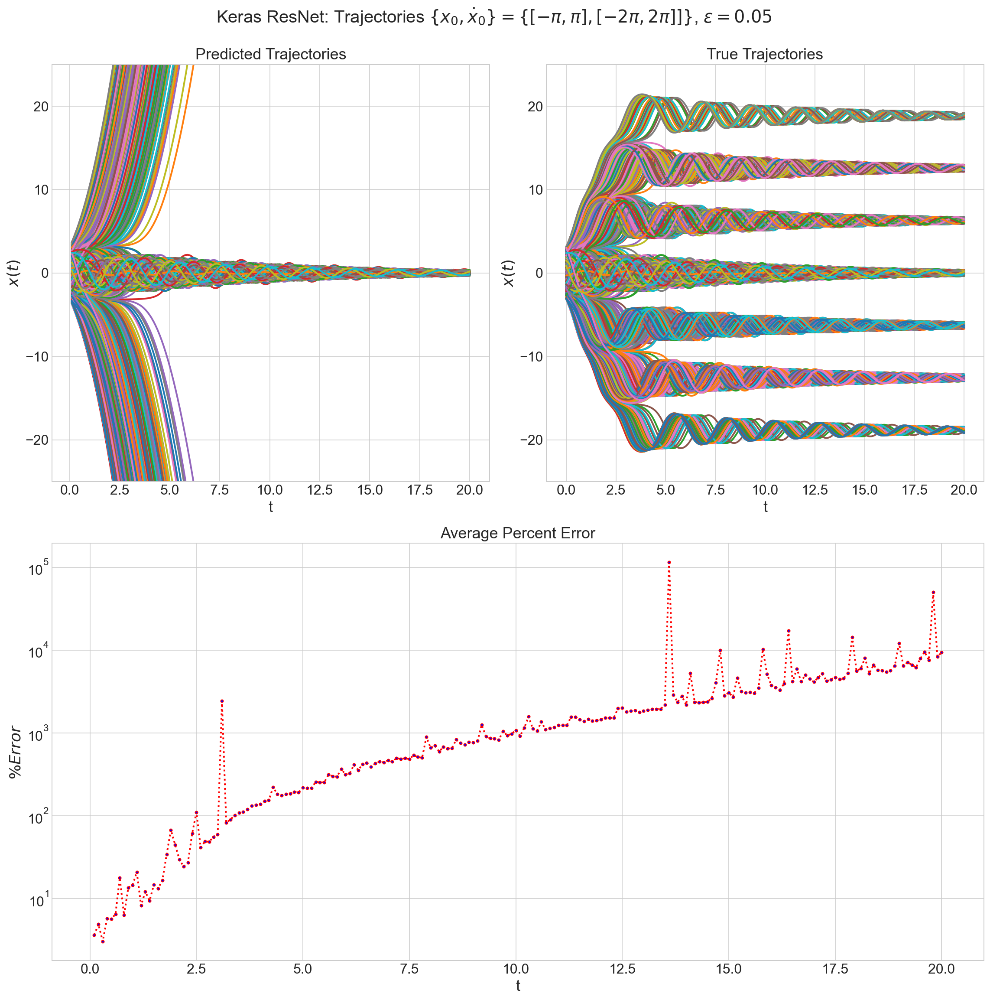

In [47]:
plot_multiple_trajectories(
    t4, t_steps4, X_true_arr4, X_pred_arr4, n_samples=5000, up_ylim=[-25,25],
    title="Keras ResNet: Trajectories "
    "$\{x_{0},\dot{x}_{0}\} = \{[-\pi,\pi],[-2\pi,2\pi]]\}$, $\epsilon = 0.05$"
)

In [54]:
nb_end = time.time()
print("\n Time: {:.2f} minutes".format((nb_end-nb_start)/60))


 Time: 64.28 minutes


Although the NumPy version of the model perform slightly better overall, the Keras version converges much faster. Both fail to predict the motion of the pendulum fully rotating around,and a more powerful would be needed to fully learn the behavior of the pendulum. 

# References

[1] T. Qin et al. Data driven governing equations approximation using deep neural networks, Journal of Computational Physics 395 (2019), 620-635

[2] Kingma, D. P., & Ba, J. L. (2015). Adam: a Method for Stochastic Optimization. International Conference on Learning Representations, 1–13